In [129]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from scipy.spatial.distance import mahalanobis
from sklearn.mixture import GaussianMixture
import matplotlib.cm as cm

from scipy.stats import levene, shapiro, f_oneway

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.svm import SVC

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_curve, roc_auc_score

%matplotlib inline

In [130]:
sns.set_style("dark")
sns.set_palette('crest')

In [131]:
train = pd.read_csv("supply_chain_train.csv")
train.head()

,train_idx,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
0,0,713071383,54,F,1,Unknown,Single,Unknown,Blue,36,...,3,3723.0,1728,1995.0,0.595,8554,99,0.678,0.464,1
1,1,714246333,58,F,4,High School,Married,Unknown,Blue,48,...,3,5396.0,1803,3593.0,0.493,2107,39,0.393,0.334,0
2,2,718206783,45,F,4,Unknown,Single,Less than $40K,Gold,36,...,3,15987.0,1648,14339.0,0.732,1436,36,1.250,0.103,1
3,3,721096983,34,F,2,Graduate,Single,Less than $40K,Blue,36,...,4,3625.0,2517,1108.0,1.158,2616,46,1.300,0.694,1
4,4,720028683,49,F,2,High School,Married,$40K - $60K,Blue,39,...,4,2720.0,1926,794.0,0.602,3806,61,0.794,0.708,1


In [132]:
test = pd.read_csv("supply_chain_test.csv")
test.head()

,test_idx,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,719455083,48,F,3,Uneducated,Single,Less than $40K,Blue,39,...,3,4,2991.0,1508,1483.0,0.703,3734,64,0.882,0.504
1,1,773503308,59,M,1,Uneducated,Single,Less than $40K,Blue,53,...,5,4,2192.0,1569,623.0,0.706,4010,79,0.717,0.716
2,2,715452408,37,F,2,Graduate,Divorced,Less than $40K,Blue,36,...,3,3,1734.0,987,747.0,0.879,4727,67,0.914,0.569
3,3,711264033,47,M,3,Doctorate,Divorced,$40K - $60K,Blue,36,...,2,3,4786.0,1516,3270.0,0.940,4973,74,0.850,0.317
4,4,718943508,42,M,3,Unknown,Single,$80K - $120K,Blue,33,...,3,2,3714.0,2170,1544.0,0.524,1454,35,0.522,0.584


In [133]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8101 entries, 0 to 8100
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   train_idx                 8101 non-null   int64  
 1   CLIENTNUM                 8101 non-null   int64  
 2   Customer_Age              8101 non-null   int64  
 3   Gender                    8101 non-null   object 
 4   Dependent_count           8101 non-null   int64  
 5   Education_Level           8101 non-null   object 
 6   Marital_Status            8101 non-null   object 
 7   Income_Category           8101 non-null   object 
 8   Card_Category             8101 non-null   object 
 9   Months_on_book            8101 non-null   int64  
 10  Total_Relationship_Count  8101 non-null   int64  
 11  Months_Inactive_12_mon    8101 non-null   int64  
 12  Contacts_Count_12_mon     8101 non-null   int64  
 13  Credit_Limit              8101 non-null   float64
 14  Total_Re

In [134]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
train_idx,8101.0,4.050000e+03,2.338702e+03,0.0,2.025000e+03,4.050000e+03,6.075000e+03,8.100000e+03
CLIENTNUM,8101.0,7.391329e+08,3.691912e+07,708082083.0,7.130534e+08,7.178860e+08,7.728464e+08,8.283431e+08
Customer_Age,8101.0,4.630638e+01,8.022527e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.000000e+01
Dependent_count,8101.0,2.334773e+00,1.289564e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,8101.0,3.592359e+01,8.024359e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,8101.0,3.813233e+00,1.551838e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,8101.0,2.346871e+00,1.014177e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,8101.0,2.450315e+00,1.100687e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,8101.0,8.636548e+03,9.086420e+03,1438.3,2.555000e+03,4.549000e+03,1.112800e+04,3.451600e+04
Total_Revolving_Bal,8101.0,1.160383e+03,8.155043e+02,0.0,3.260000e+02,1.273000e+03,1.782000e+03,2.517000e+03


In [135]:
train.isna().sum()

train_idx                   0
CLIENTNUM                   0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
Attrition_Flag              0
dtype: int64

In [136]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2026 entries, 0 to 2025
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   test_idx                  2026 non-null   int64  
 1   CLIENTNUM                 2026 non-null   int64  
 2   Customer_Age              2026 non-null   int64  
 3   Gender                    2026 non-null   object 
 4   Dependent_count           2026 non-null   int64  
 5   Education_Level           2026 non-null   object 
 6   Marital_Status            2026 non-null   object 
 7   Income_Category           2026 non-null   object 
 8   Card_Category             2026 non-null   object 
 9   Months_on_book            2026 non-null   int64  
 10  Total_Relationship_Count  2026 non-null   int64  
 11  Months_Inactive_12_mon    2026 non-null   int64  
 12  Contacts_Count_12_mon     2026 non-null   int64  
 13  Credit_Limit              2026 non-null   float64
 14  Total_Re

In [137]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
test_idx,2026.0,1.012500e+03,5.850001e+02,0.0,5.062500e+02,1.012500e+03,1.518750e+03,2.025000e+03
CLIENTNUM,2026.0,7.393562e+08,3.685098e+07,708095133.0,7.129813e+08,7.180845e+08,7.750037e+08,8.282919e+08
Customer_Age,2026.0,4.640424e+01,7.995428e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,2026.0,2.391905e+00,1.334967e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,2026.0,3.594768e+01,7.834790e+00,13.0,3.200000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,2026.0,3.809970e+00,1.565025e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,2026.0,2.318361e+00,9.962044e-01,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,2026.0,2.475321e+00,1.128151e+00,0.0,2.000000e+00,3.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,2026.0,8.613583e+03,9.100417e+03,1438.3,2.571250e+03,4.563500e+03,1.070750e+04,3.451600e+04
Total_Revolving_Bal,2026.0,1.172536e+03,8.130452e+02,0.0,5.047500e+02,1.290000e+03,1.793000e+03,2.517000e+03


In [138]:
test.isna().sum()

test_idx                    0
CLIENTNUM                   0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [139]:
target = "Attrition_Flag"

In [140]:
# select non-numeric columns
non_numeric_cols = train.select_dtypes(exclude=['number']).columns.tolist()

# print the result
print(non_numeric_cols)

['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']


In [141]:
train[non_numeric_cols[0]].unique()

array(['F', 'M'], dtype=object)

In [142]:
train[non_numeric_cols[1]].unique()

array(['Unknown', 'High School', 'Graduate', 'Doctorate', 'Post-Graduate',
       'Uneducated', 'College'], dtype=object)

In [143]:
train[non_numeric_cols[2]].unique()

array(['Single', 'Married', 'Divorced', 'Unknown'], dtype=object)

In [144]:
train[non_numeric_cols[3]].unique()

array(['Unknown', 'Less than $40K', '$40K - $60K', '$60K - $80K',
       '$80K - $120K', '$120K +'], dtype=object)

In [145]:
train[non_numeric_cols[4]].unique()

array(['Blue', 'Gold', 'Silver', 'Platinum'], dtype=object)

In [146]:
train_ohe = pd.get_dummies(train[non_numeric_cols])
train_concat = pd.concat([train, train_ohe], axis=1)
train_concat.drop(non_numeric_cols, axis=1, inplace=True)

In [147]:
test_ohe = pd.get_dummies(test[non_numeric_cols])
test_concat = pd.concat([test, test_ohe], axis=1)
test_concat.drop(non_numeric_cols, axis=1, inplace=True)

In [148]:
train_concat.head()

,train_idx,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0,713071383,54,1,36,1,3,3,3723.0,1728,...,0,0,0,0,0,1,1,0,0,0
1,1,714246333,58,4,48,1,4,3,5396.0,1803,...,0,0,0,0,0,1,1,0,0,0
2,2,718206783,45,4,36,6,1,3,15987.0,1648,...,0,0,0,0,1,0,0,1,0,0
3,3,721096983,34,2,36,4,3,4,3625.0,2517,...,0,0,0,0,1,0,1,0,0,0
4,4,720028683,49,2,39,5,3,4,2720.0,1926,...,0,1,0,0,0,0,1,0,0,0


First off, we should drop all the extra categorical variables generated by the OHE since we going to use Logistic Regression. Therefore, our goal is to avoid multicollinearity. 

In [149]:
train_concat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8101 entries, 0 to 8100
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   train_idx                       8101 non-null   int64  
 1   CLIENTNUM                       8101 non-null   int64  
 2   Customer_Age                    8101 non-null   int64  
 3   Dependent_count                 8101 non-null   int64  
 4   Months_on_book                  8101 non-null   int64  
 5   Total_Relationship_Count        8101 non-null   int64  
 6   Months_Inactive_12_mon          8101 non-null   int64  
 7   Contacts_Count_12_mon           8101 non-null   int64  
 8   Credit_Limit                    8101 non-null   float64
 9   Total_Revolving_Bal             8101 non-null   int64  
 10  Avg_Open_To_Buy                 8101 non-null   float64
 11  Total_Amt_Chng_Q4_Q1            8101 non-null   float64
 12  Total_Trans_Amt                 81

In [150]:
f_train = train_concat.drop(['Gender_F', 'Education_Level_Unknown',\
                                 'Marital_Status_Unknown', 'Income_Category_Unknown',\
                                 "Card_Category_Silver"], axis=1)

f_test = test_concat.drop(['Gender_F', 'Education_Level_Unknown',\
                                 'Marital_Status_Unknown', 'Income_Category_Unknown',\
                                 "Card_Category_Silver"], axis=1)

##### Univariate Analysis

In [151]:
train.head()

,train_idx,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
0,0,713071383,54,F,1,Unknown,Single,Unknown,Blue,36,...,3,3723.0,1728,1995.0,0.595,8554,99,0.678,0.464,1
1,1,714246333,58,F,4,High School,Married,Unknown,Blue,48,...,3,5396.0,1803,3593.0,0.493,2107,39,0.393,0.334,0
2,2,718206783,45,F,4,Unknown,Single,Less than $40K,Gold,36,...,3,15987.0,1648,14339.0,0.732,1436,36,1.250,0.103,1
3,3,721096983,34,F,2,Graduate,Single,Less than $40K,Blue,36,...,4,3625.0,2517,1108.0,1.158,2616,46,1.300,0.694,1
4,4,720028683,49,F,2,High School,Married,$40K - $60K,Blue,39,...,4,2720.0,1926,794.0,0.602,3806,61,0.794,0.708,1


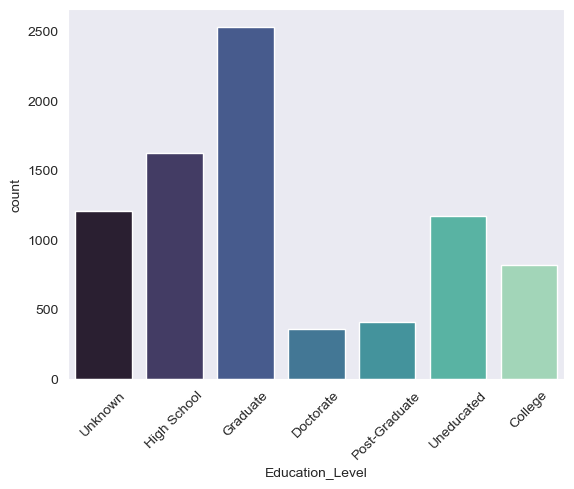

In [152]:
ax = sns.countplot(x="Education_Level", data=train, palette="mako") #color="skyblue")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45);

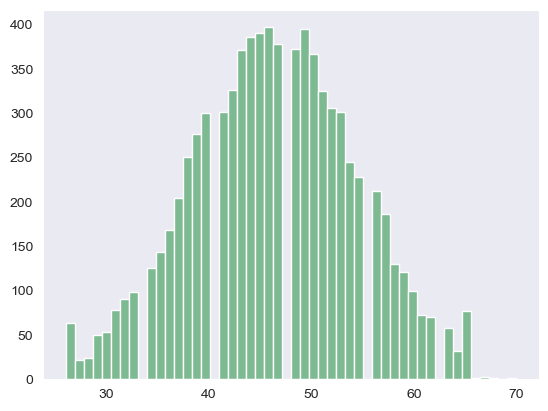

In [153]:
plt.hist(x="Customer_Age", data= train, bins=50);

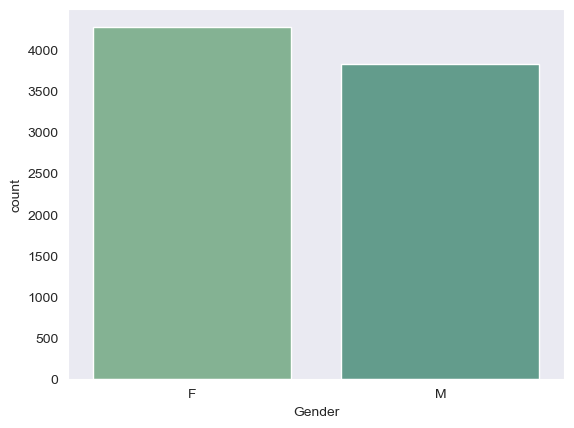

In [154]:
sns.countplot(x="Gender", data=train);

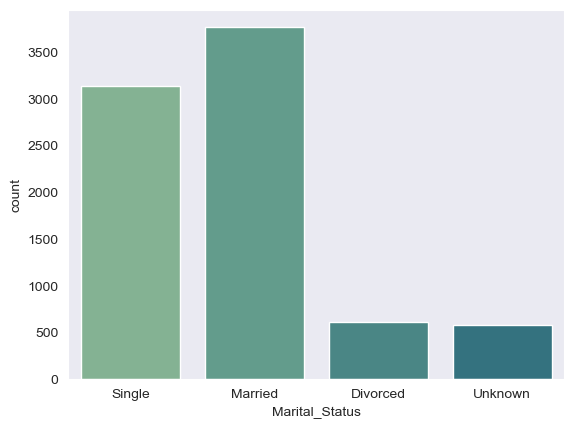

In [155]:
sns.countplot(x="Marital_Status", data=train);

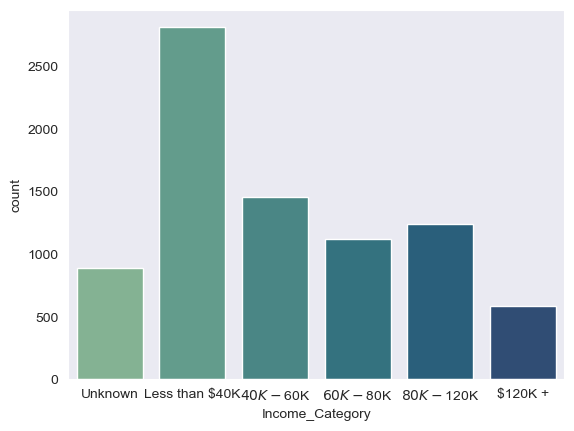

In [156]:
sns.countplot(x="Income_Category", data=train);

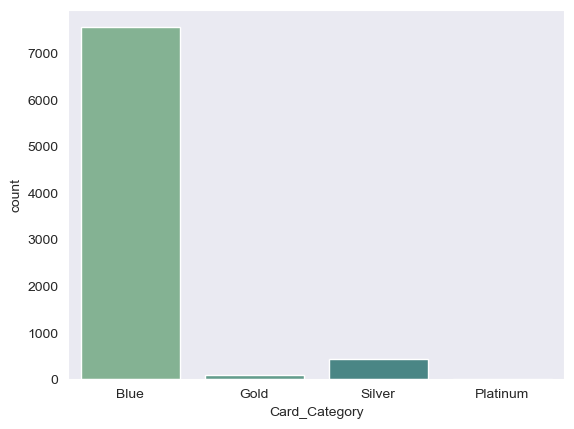

In [157]:
sns.countplot(x="Card_Category", data=train);

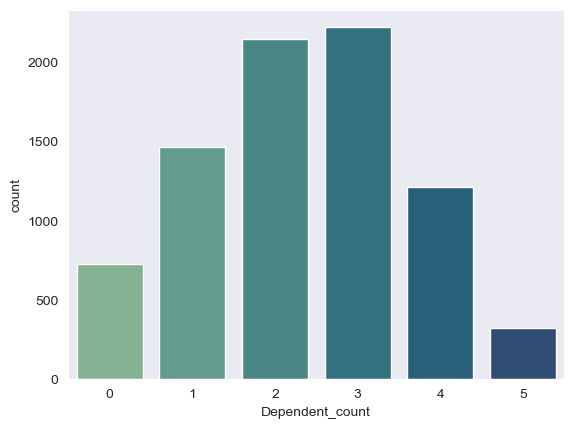

In [158]:
sns.countplot(x="Dependent_count", data=train);

In [159]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8101 entries, 0 to 8100
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   train_idx                 8101 non-null   int64  
 1   CLIENTNUM                 8101 non-null   int64  
 2   Customer_Age              8101 non-null   int64  
 3   Gender                    8101 non-null   object 
 4   Dependent_count           8101 non-null   int64  
 5   Education_Level           8101 non-null   object 
 6   Marital_Status            8101 non-null   object 
 7   Income_Category           8101 non-null   object 
 8   Card_Category             8101 non-null   object 
 9   Months_on_book            8101 non-null   int64  
 10  Total_Relationship_Count  8101 non-null   int64  
 11  Months_Inactive_12_mon    8101 non-null   int64  
 12  Contacts_Count_12_mon     8101 non-null   int64  
 13  Credit_Limit              8101 non-null   float64
 14  Total_Re

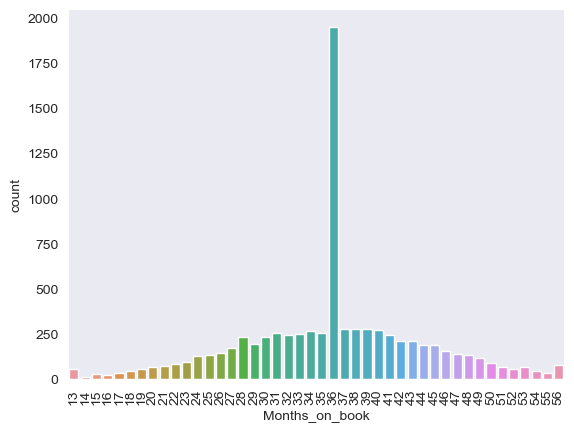

In [160]:
# plt.figure(figsize=(30, 30))
ax = sns.countplot(x="Months_on_book", data=train)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

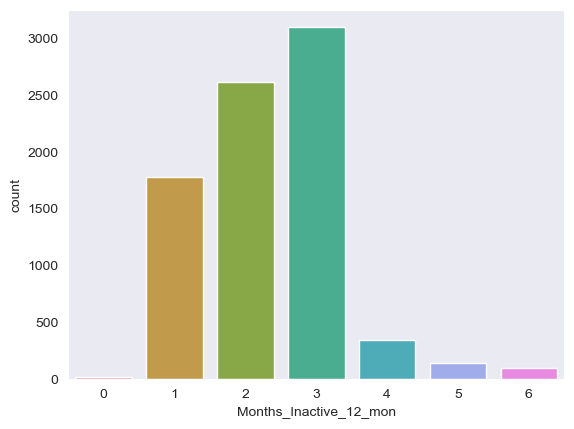

In [161]:
sns.countplot(x="Months_Inactive_12_mon", data=train);

##### Bivariate Analysis

In [162]:
def plot_corr_heatmap(df, threshold=0.1, method="pearson"):
    # Create a correlation matrix using the kendall method
    corr_matrix = df.corr(method)

    # Create a mask to hide the lower triangle of the matrix
    mask = np.zeros_like(corr_matrix, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Create a new mask to show only the values above the threshold
    new_mask = np.abs(corr_matrix) < threshold
    mask = mask | new_mask

    # Create a heatmap of the correlation matrix with the modified mask
    plt.figure(figsize=(30, 30))
    sns.heatmap(corr_matrix, annot=True, mask=mask, vmin=-1, vmax=1, cmap='coolwarm')
    plt.show()

C:\Users\Vladi\AppData\Local\Temp\ipykernel_12976\668804696.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr_matrix, dtype=np.bool)


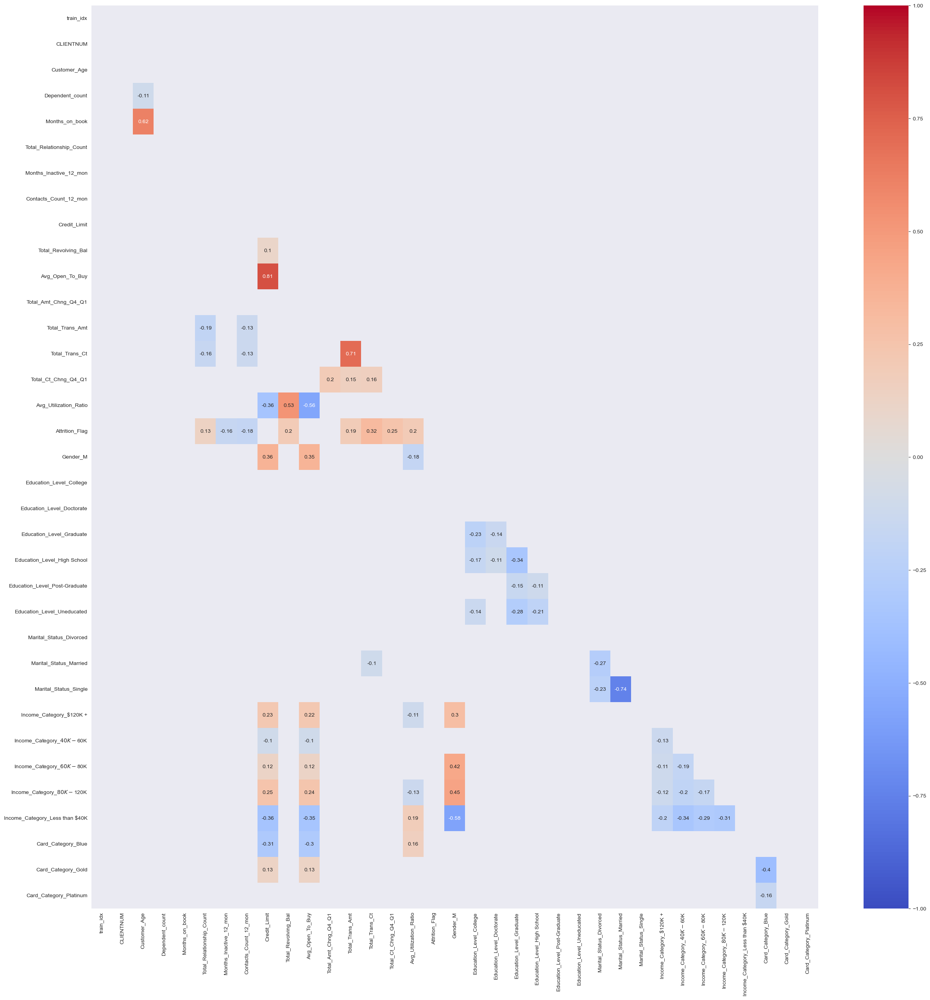

In [163]:
plot_corr_heatmap(f_train, 0.1, "kendall")

In [164]:
print(train_concat.isna().sum())

train_idx                         0
CLIENTNUM                         0
Customer_Age                      0
Dependent_count                   0
Months_on_book                    0
Total_Relationship_Count          0
Months_Inactive_12_mon            0
Contacts_Count_12_mon             0
Credit_Limit                      0
Total_Revolving_Bal               0
Avg_Open_To_Buy                   0
Total_Amt_Chng_Q4_Q1              0
Total_Trans_Amt                   0
Total_Trans_Ct                    0
Total_Ct_Chng_Q4_Q1               0
Avg_Utilization_Ratio             0
Attrition_Flag                    0
Gender_F                          0
Gender_M                          0
Education_Level_College           0
Education_Level_Doctorate         0
Education_Level_Graduate          0
Education_Level_High School       0
Education_Level_Post-Graduate     0
Education_Level_Uneducated        0
Education_Level_Unknown           0
Marital_Status_Divorced           0
Marital_Status_Married      

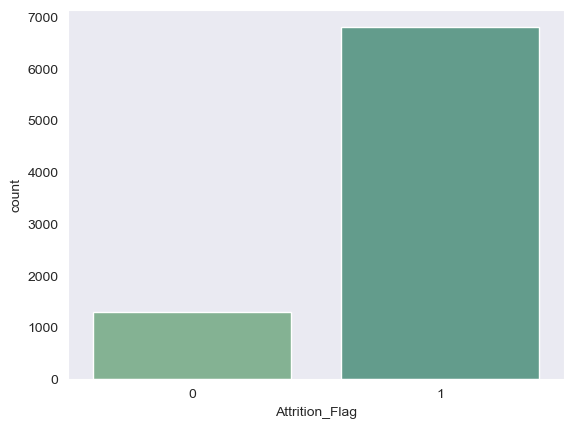

In [165]:
# count plot on single categorical variable
sns.countplot(x = target, data = f_train)
 
# Show the plot
plt.show()

It looks like we are dealing with another umbalanced distribution. Which means that the Logistic regression will be very sensitive to this umbalance

In [166]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8101 entries, 0 to 8100
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   train_idx                 8101 non-null   int64  
 1   CLIENTNUM                 8101 non-null   int64  
 2   Customer_Age              8101 non-null   int64  
 3   Gender                    8101 non-null   object 
 4   Dependent_count           8101 non-null   int64  
 5   Education_Level           8101 non-null   object 
 6   Marital_Status            8101 non-null   object 
 7   Income_Category           8101 non-null   object 
 8   Card_Category             8101 non-null   object 
 9   Months_on_book            8101 non-null   int64  
 10  Total_Relationship_Count  8101 non-null   int64  
 11  Months_Inactive_12_mon    8101 non-null   int64  
 12  Contacts_Count_12_mon     8101 non-null   int64  
 13  Credit_Limit              8101 non-null   float64
 14  Total_Re

In [167]:
numeric_features = train.select_dtypes(include=np.number).columns.tolist()

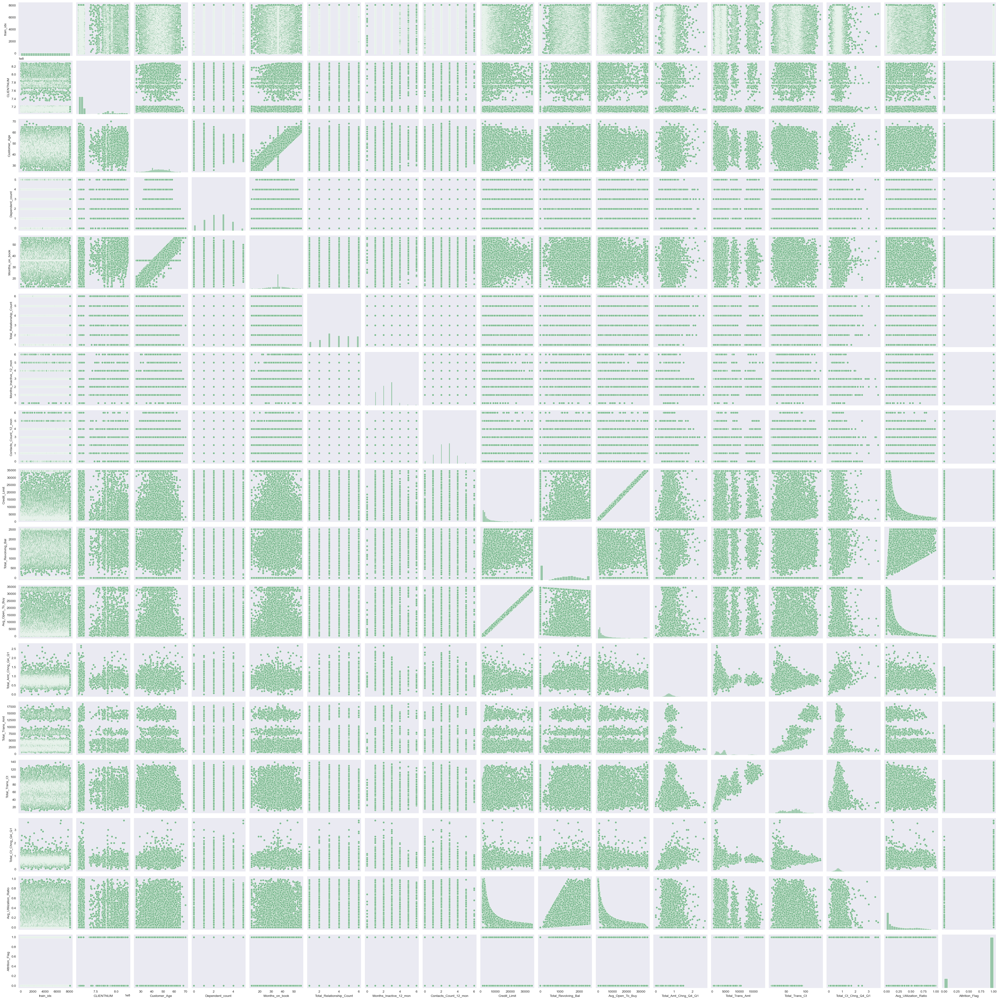

In [168]:
sns.pairplot(train[numeric_features])

C:\Users\Vladi\AppData\Local\Temp\ipykernel_12976\668804696.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr(method)
C:\Users\Vladi\AppData\Local\Temp\ipykernel_12976\668804696.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr_matrix, dtype=np.bool)


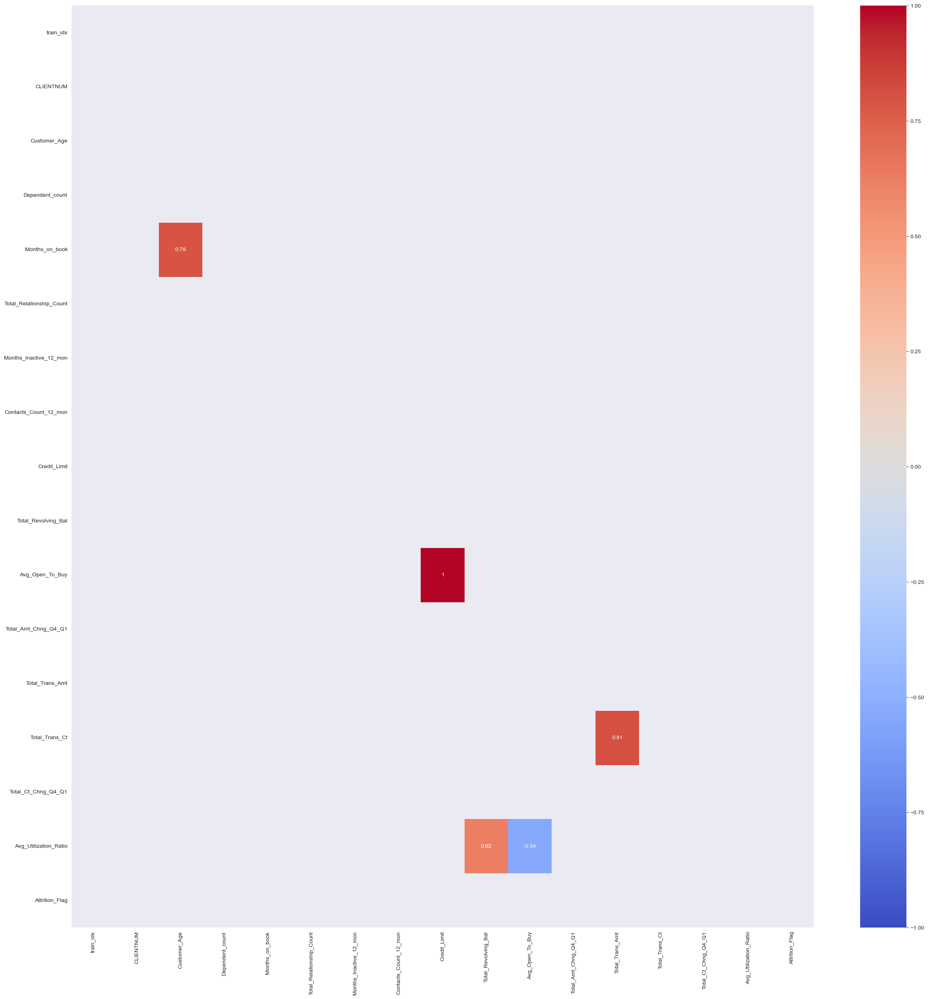

In [169]:
plot_corr_heatmap(train, 0.5, "pearson");

<AxesSubplot:xlabel='Months_on_book', ylabel='Customer_Age'>

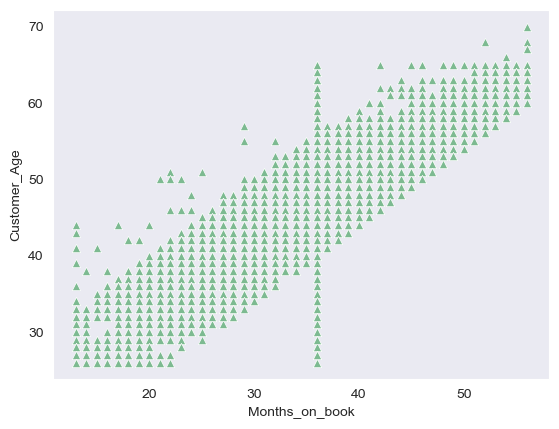

In [170]:
sns.scatterplot(x="Months_on_book", y="Customer_Age", data=train, marker='^')

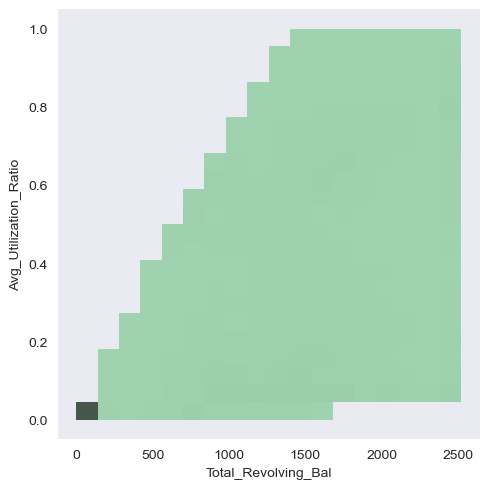

In [171]:
sns.displot(x="Total_Revolving_Bal", y="Avg_Utilization_Ratio", data=train)

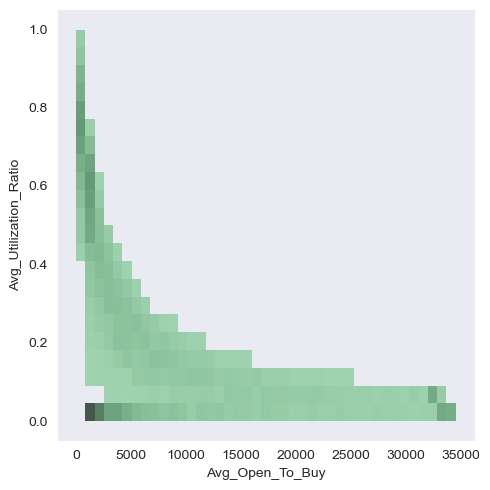

In [172]:
sns.displot(x="Avg_Open_To_Buy", y="Avg_Utilization_Ratio", data=train)

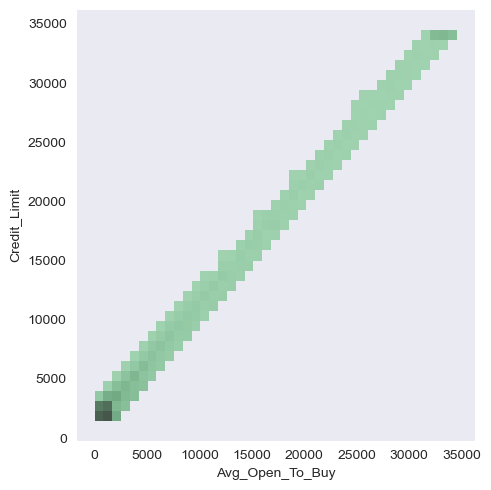

In [173]:
sns.displot(x="Avg_Open_To_Buy", y="Credit_Limit", data=train)

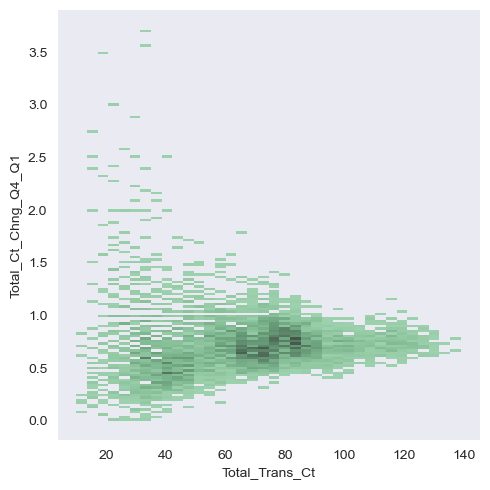

In [174]:
sns.displot(x="Total_Trans_Ct", y="Total_Ct_Chng_Q4_Q1", data=train)

In [175]:
numeric_features

['train_idx',
 'CLIENTNUM',
 'Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Attrition_Flag']

##### Hypothesis testing

In [176]:
def levene_test(*args, **kwargs):
    '''
    Perform Levene's test for homogeneity of variances.
    
    Parameters:
    -----------
    *args : array-like
        Input samples.
        
    kwargs : dict
        Additional parameters to be passed to the Levene test.
    
    Returns:
    --------
    statistic : float
        Test statistic.
        
    p-value : float
        Two-sided p-value for the test.
    '''
    # Calculate the test statistic and p-value
    stat, p_val = levene(*args, **kwargs)
    
    # Print the test results and interpretation
    print(f"Levene test statistic: {stat:.4f}")
    print(f"Levene test p-value: {p_val:.4f}")
    
    # Interpret the results
    if p_val < 0.05:
        print("The Levene test is significant, indicating that there is significant evidence against the null hypothesis of equal variances.")
    else:
        print("The Levene test is not significant, indicating that there is not enough evidence against the null hypothesis of equal variances.")
        
    # Return the test statistic and p-value
    return stat, p_val

In [177]:
def shapiro_test(x):
    '''
    Perform Shapiro-Wilk test for normality.
    
    Parameters:
    -----------
    x : array-like
        Input sample.
        
    Returns:
    --------
    statistic : float
        Test statistic.
        
    p-value : float
        Two-sided p-value for the test.
    '''
    # Calculate the test statistic and p-value
    stat, p_val = shapiro(x)
    
    # Print the test results and interpretation
    print(f"Shapiro-Wilk test statistic: {stat:.4f}")
    print(f"Shapiro-Wilk test p-value: {p_val:.4f}")
    
    # Interpret the results
    if p_val < 0.05:
        print("The Shapiro-Wilk test is significant, indicating that there is significant evidence against the null hypothesis of normality.")
    else:
        print("The Shapiro-Wilk test is not significant, indicating that there is not enough evidence against the null hypothesis of normality.")
        
    # Return the test statistic and p-value
    return stat, p_val

In [178]:
train.head()

,train_idx,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
0,0,713071383,54,F,1,Unknown,Single,Unknown,Blue,36,...,3,3723.0,1728,1995.0,0.595,8554,99,0.678,0.464,1
1,1,714246333,58,F,4,High School,Married,Unknown,Blue,48,...,3,5396.0,1803,3593.0,0.493,2107,39,0.393,0.334,0
2,2,718206783,45,F,4,Unknown,Single,Less than $40K,Gold,36,...,3,15987.0,1648,14339.0,0.732,1436,36,1.250,0.103,1
3,3,721096983,34,F,2,Graduate,Single,Less than $40K,Blue,36,...,4,3625.0,2517,1108.0,1.158,2616,46,1.300,0.694,1
4,4,720028683,49,F,2,High School,Married,$40K - $60K,Blue,39,...,4,2720.0,1926,794.0,0.602,3806,61,0.794,0.708,1


In [179]:
levene_test(train["Customer_Age"], train["Dependent_count"])

Levene test statistic: 10179.0775
Levene test p-value: 0.0000
The Levene test is significant, indicating that there is significant evidence against the null hypothesis of equal variances.


(10179.07749901874, 0.0)

In [180]:
shapiro_test(train["Customer_Age"])

Shapiro-Wilk test statistic: 0.9958
Shapiro-Wilk test p-value: 0.0000
The Shapiro-Wilk test is significant, indicating that there is significant evidence against the null hypothesis of normality.


C:\Users\Vladi\anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


(0.9957692623138428, 1.2201358833333585e-14)

In [181]:
shapiro_test(train["Dependent_count"])

Shapiro-Wilk test statistic: 0.9368
Shapiro-Wilk test p-value: 0.0000
The Shapiro-Wilk test is significant, indicating that there is significant evidence against the null hypothesis of normality.


(0.9367599487304688, 0.0)

##### ANOVA

In [182]:
def anova_test(*args):
    '''
    Perform one-way ANOVA.
    
    Parameters:
    -----------
    *args : array-like
        Input samples.
        
    Returns:
    --------
    statistic : float
        Test statistic.
        
    p-value : float
        one-sided p-value for the test.
    '''
    stat, p_val = f_oneway(*args)
    
    print("One-way ANOVA test statistic:", stat)
    print("p-value:", p_val)
    
    return stat, p_val

##### Chi-squared

In [183]:
def chi_squared_test(observed, expected=None):
    '''
    Perform chi-squared test of independence.
    
    Parameters:
    -----------
    observed : array-like
        Contingency table of observed counts.
        
    expected : array-like, optional
        Contingency table of expected counts. If None (default), calculate the expected counts assuming independence.
        
    Returns:
    --------
    statistic : float
        Test statistic.
        
    p-value : float
        Two-sided p-value for the test.
    '''
    # Calculate the test statistic and p-value
    if expected is None:
        stat, p_val, _, _ = chi2_contingency(observed)
    else:
        stat, p_val = chisquare(observed, expected, axis=None)
    
    # Print the test results and interpretation
    print(f"Chi-squared test statistic: {stat:.4f}")
    print(f"Chi-squared test p-value: {p_val:.4f}")
    
    # Interpret the results
    if p_val < 0.05:
        print("The chi-squared test is significant, indicating that there is significant evidence against the null hypothesis of independence.")
    else:
        print("The chi-squared test is not significant, indicating that there is not enough evidence against the null hypothesis of independence.")
        
    # Return the test statistic and p-value
    return stat, p_val

##### Dimensionality Reduction

In [184]:
y = f_train[target]
X = f_train.drop(target, axis=1)

In [185]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [186]:
# Standardize data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(f_test)

C:\Users\Vladi\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- test_idx
Feature names seen at fit time, yet now missing:
- train_idx

  warnings.warn(message, FutureWarning)


In [187]:
# Create PCA object
pca = PCA(n_components=3)

In [188]:
# Fit and transform the data to PCA
X_pca = pca.fit_transform(X_train_scaled)
X_pca_val = pca.transform(X_val_scaled)
X_pca_test = pca.transform(X_test_scaled)

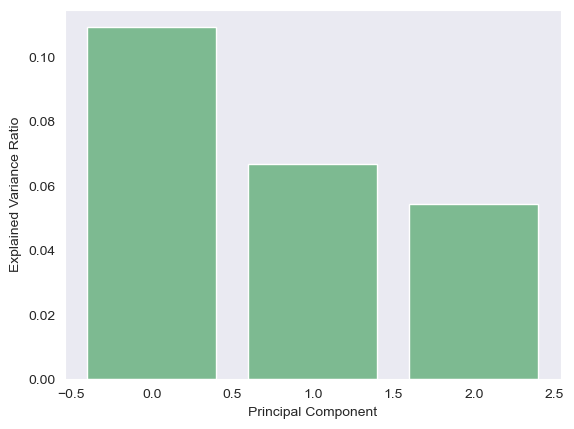

In [189]:
# Get explained variance ratio of each principal component
variance_ratio = pca.explained_variance_ratio_

# Plot explained variance ratio of each principal component as a bar plot
plt.bar(range(len(variance_ratio)), variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.show()

##### Clustering and outlier detection

##### K-means

In [190]:
# Use K-means clustering on the top 3 PCs
kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(X_pca)

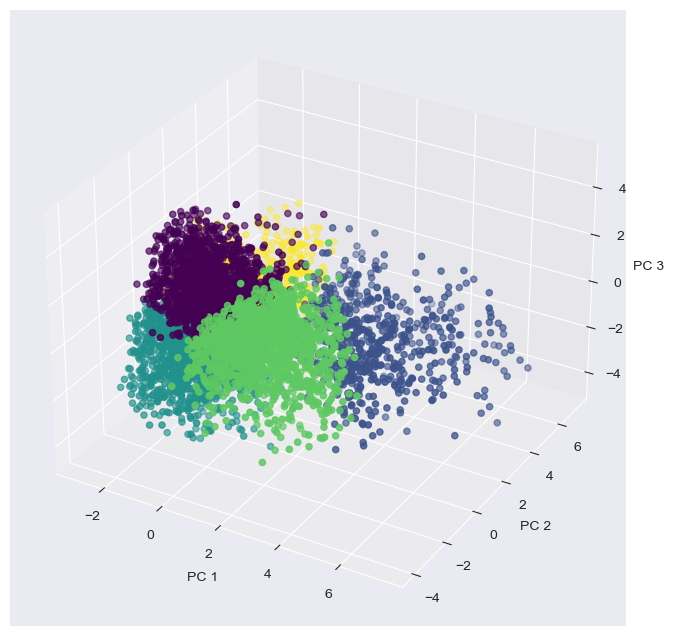

In [191]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=labels, cmap='viridis')

ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_zlabel('PC 3')

plt.show()

##### Elbow Method

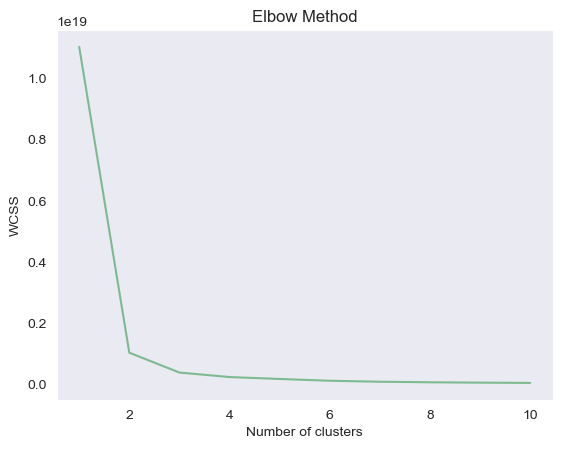

In [192]:
# Create an instance of KMeans for each value of k
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Plot the WCSS values for each value of k
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [193]:
kmeans = KMeans(n_clusters=2, random_state=42)
labels = kmeans.fit_predict(X_pca)

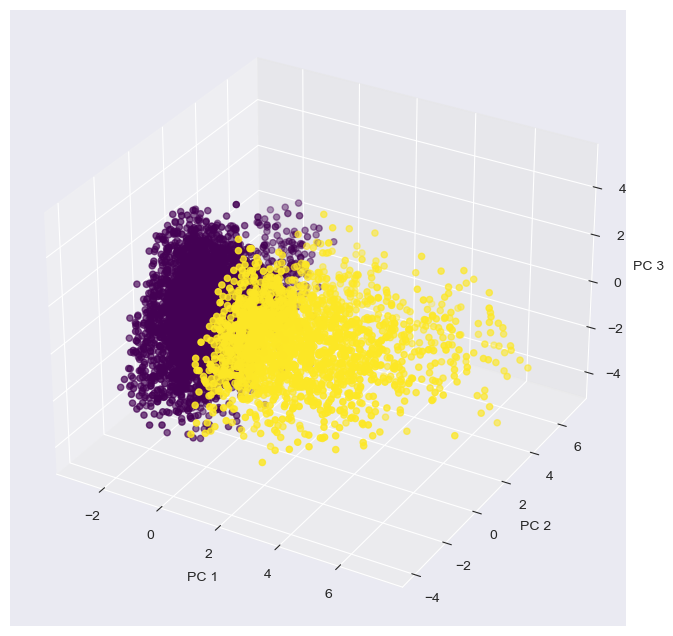

In [194]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=labels, cmap='viridis')

ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_zlabel('PC 3')

plt.show()

##### Mahalanobis Distance 

In [195]:
# Calculate the covariance matrix of the top 3 PCs
cov_matrix = np.cov(X_pca.T)

In [196]:
# Calculate the inverse of the covariance matrix
inv_cov_matrix = np.linalg.inv(cov_matrix)

In [197]:
# Calculate the center of the PCA space
center = np.mean(X_pca, axis=0)

In [198]:
# Calculate the Mahalanobis distance of each data point from the center
distances = []
for point in X_pca:
    distance = mahalanobis(point, center, inv_cov_matrix)
    distances.append(distance)

In [199]:
# Identify the outliers as the data points with distances above a certain threshold
threshold = np.percentile(distances, 99)
outliers = [i for i, distance in enumerate(distances) if distance > threshold]

##### Gaussian Mixture Models

In [200]:
# fit GMM to the data
gmm = GaussianMixture(n_components=3)
# gmm.fit(X_pca)
labels_gmm = gmm.fit_predict(X_pca)

In [201]:
# calculate the log-likelihood of each data point
log_likelihood = gmm.score_samples(X_pca)

In [202]:
# set a threshold for defining outliers
threshold = np.percentile(log_likelihood, 5) # 5th percentile

In [203]:
# identify the outliers
outliers = X_train[log_likelihood < threshold]

In [204]:
print("Number of outliers:", len(outliers))

Number of outliers: 324


In [205]:
def bic_components_selection(max_range=10, X_train=None, X_val=None, X_test=None):
    n_components_range = range(1, max_range)
    bic_scores = []
    
    # Fit GMM and calculate BIC score for training set only
    for n_components in n_components_range:
        gmm = GaussianMixture(n_components=n_components)
        gmm.fit(X_train)
        bic_scores.append(gmm.bic(X_train))
        
    # Find best number of components based on training BIC score
    best_n_components = np.argmin(bic_scores) + 1
    print(f"The total number of mixtures for the GMM is {best_n_components}")
    
    # Fit GMM with best number of components on training set
    gmm = GaussianMixture(n_components=best_n_components)
    gmm.fit(X_train)
    
    # Calculate log-likelihood scores for validation and test sets
    train_score = gmm.score(X_train)
    val_score = gmm.score(X_val)
    test_score = gmm.score(X_test)
    
    return gmm, best_n_components, train_score, val_score, test_score

In [206]:
gmm, best_n_components, train_score, val_score, test_score = bic_components_selection(max_range=10, X_train=X_pca, X_val=X_pca_val, X_test=X_pca_test)

The total number of mixtures for the GMM is 6


We recodify the outliers into a new cluster so these extreme values don't affect our prediction.

<!-- # def plot_gmm(X_pca=X_pca, n_clusters=10, gmm=gmm):
#     fig = plt.figure(figsize=(12, 12))
#     ax = fig.add_subplot(111, projection='3d')
#     colors = ["crimson", "cyan",  "teal", "sandybrown", "dimgrey", "slateblue",
#              "gold", "fuchsia", "salmon"]
#     # predict the labels with GMM 
#     labels = gmm.predict(X_pca)
#     # calculate log-probabilities of each sample
#     log_probs = gmm.score_samples(X_pca)
    
#     # set a threshold for outlier detection
#     threshold_lower = np.percentile(log_probs, 5)
#     threshold_upper = np.percentile(log_probs, 95)
    
#     # detect outliers based on low log-probability
#     is_outlier_lower = log_probs < threshold_lower
#     is_outlier_upper = log_probs > threshold_upper
    
#     # create a new label for the outliers
#     outlier_cluster = n_clusters + 1
#     for i in range(len(labels)):
#         if is_outlier_lower[i] == True or is_outlier_upper[i] == True:
#             labels[i] = outlier_cluster
    
#     # scatter plot for GMM clusters
#     for i in range(n_clusters + 1):
#         if i == n_clusters + 1:
#             ax.scatter(X_pca[outlier_cluster, 0], X_pca[outlier_cluster, 1], X_pca[outlier_cluster, 2], \
#                s=100, marker='x', color='red', label='Outliers')
#         else:
#             ax.scatter(X_pca[labels==i, 0], X_pca[labels==i, 1], X_pca[labels==i, 2], \
#                    alpha=0.5, label=f'GMM Cluster {i}', \
#                    color=np.array([colors[i]]))
    
#     #Plot the dimensions of the PCA
#     ax.set_xlabel('PC 1')
#     ax.set_ylabel('PC 2')
#     ax.set_zlabel('PC 3')

#     plt.legend()
#     plt.show()
#     return labels -->

In [207]:
def plot_gmm(X_pca=X_pca, n_clusters=10, gmm=gmm):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection='3d')
    colors = ["crimson", "cyan",  "teal", "sandybrown", "dimgrey", "slateblue",
             "gold", "fuchsia", "salmon"]
    # predict the labels with GMM 
    labels = gmm.predict(X_pca)
    # calculate log-probabilities of each sample
    log_probs = gmm.score_samples(X_pca)
    
    # set a threshold for outlier detection
    threshold_lower = np.percentile(log_probs, 5)
    threshold_upper = np.percentile(log_probs, 95)
    
    # detect outliers based on low log-probability
    is_outlier_lower = log_probs < threshold_lower
    is_outlier_upper = log_probs > threshold_upper
    
    # scatter plot with larger markers for outliers
    ax.scatter(X_pca[is_outlier_lower, 0], X_pca[is_outlier_lower, 1], X_pca[is_outlier_lower, 2], \
               s=100, marker='x', color='red', label='Lower Outliers')
    ax.scatter(X_pca[is_outlier_upper, 0], X_pca[is_outlier_upper, 1], X_pca[is_outlier_upper, 2], \
               s=100, marker='x', color='orange', label='Upper Outliers')
    
    # scatter plot for GMM clusters
    for i in range(n_clusters):
        ax.scatter(X_pca[labels==i, 0], X_pca[labels==i, 1], X_pca[labels==i, 2], \
                   alpha=0.5, label=f'GMM Cluster {i}', \
                   color=np.array([colors[i]]))
    
    # create a new label for the outliers
    outlier_cluster = n_clusters + 1
    for i in range(len(labels)):
        if is_outlier_lower[i] == True or is_outlier_upper[i] == True:
            labels[i] = outlier_cluster
    
    #Plot the dimensions of the PCA
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

    plt.legend()
    plt.show()
    return labels 

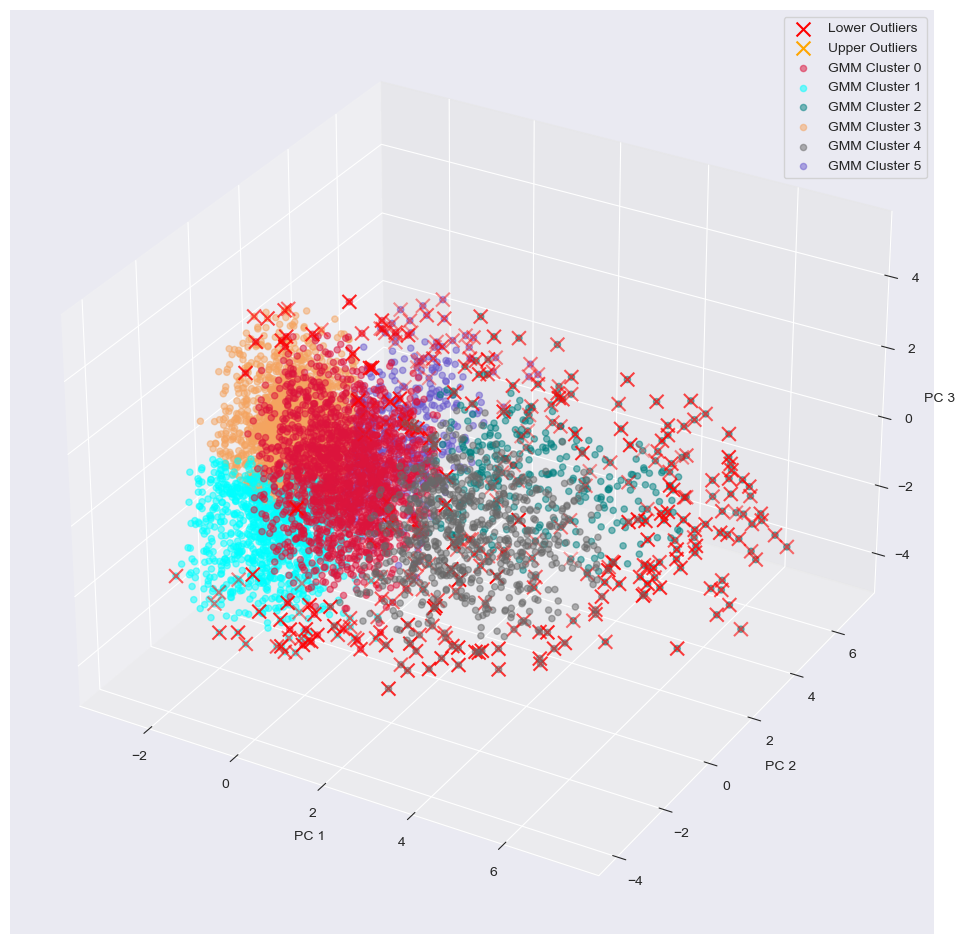

In [208]:
train_labels = plot_gmm(X_pca, n_clusters=best_n_components)

In [209]:
train_labels[-800:-40]

array([1, 4, 0, 3, 4, 1, 7, 3, 5, 2, 3, 5, 1, 7, 1, 1, 5, 0, 0, 1, 1, 0,
       0, 3, 1, 4, 0, 3, 5, 0, 7, 0, 3, 0, 4, 0, 5, 3, 1, 7, 1, 4, 3, 0,
       3, 0, 1, 5, 0, 4, 4, 0, 5, 7, 3, 3, 5, 2, 1, 5, 1, 7, 1, 5, 0, 3,
       0, 7, 3, 1, 0, 3, 5, 2, 0, 5, 1, 0, 1, 0, 7, 1, 3, 1, 0, 0, 1, 4,
       4, 3, 0, 0, 1, 1, 1, 4, 7, 7, 3, 5, 0, 3, 0, 7, 1, 0, 4, 4, 3, 2,
       7, 0, 4, 3, 0, 1, 3, 1, 7, 5, 0, 1, 3, 3, 2, 1, 3, 2, 3, 7, 0, 3,
       0, 7, 3, 7, 4, 1, 4, 5, 0, 4, 0, 3, 4, 1, 7, 0, 7, 2, 0, 4, 0, 0,
       7, 3, 5, 4, 0, 3, 0, 0, 0, 1, 5, 0, 0, 4, 3, 7, 4, 3, 3, 1, 1, 7,
       7, 0, 3, 0, 7, 3, 2, 0, 4, 3, 0, 5, 0, 3, 4, 4, 7, 0, 0, 3, 3, 0,
       0, 1, 1, 7, 0, 0, 1, 0, 3, 0, 3, 3, 7, 3, 7, 0, 0, 7, 1, 3, 0, 4,
       0, 3, 4, 3, 1, 0, 1, 3, 7, 0, 1, 3, 5, 3, 3, 4, 5, 7, 0, 0, 1, 1,
       1, 7, 0, 7, 3, 0, 5, 0, 0, 4, 0, 4, 1, 1, 1, 5, 0, 1, 0, 3, 7, 2,
       0, 0, 0, 0, 3, 0, 0, 4, 0, 1, 7, 3, 1, 7, 3, 0, 3, 1, 3, 3, 3, 3,
       0, 0, 1, 0, 1, 4, 0, 5, 3, 5, 0, 3, 0, 7, 7,

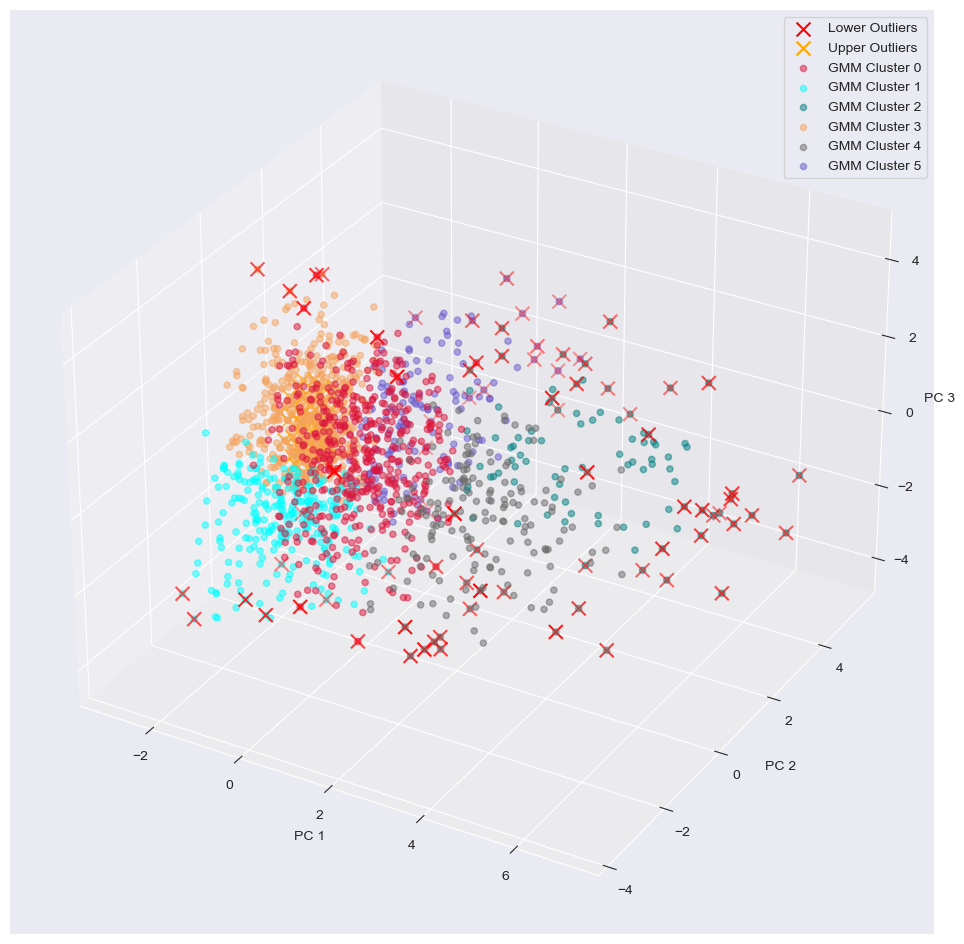

In [210]:
val_labels = plot_gmm(X_pca_val, n_clusters=best_n_components)

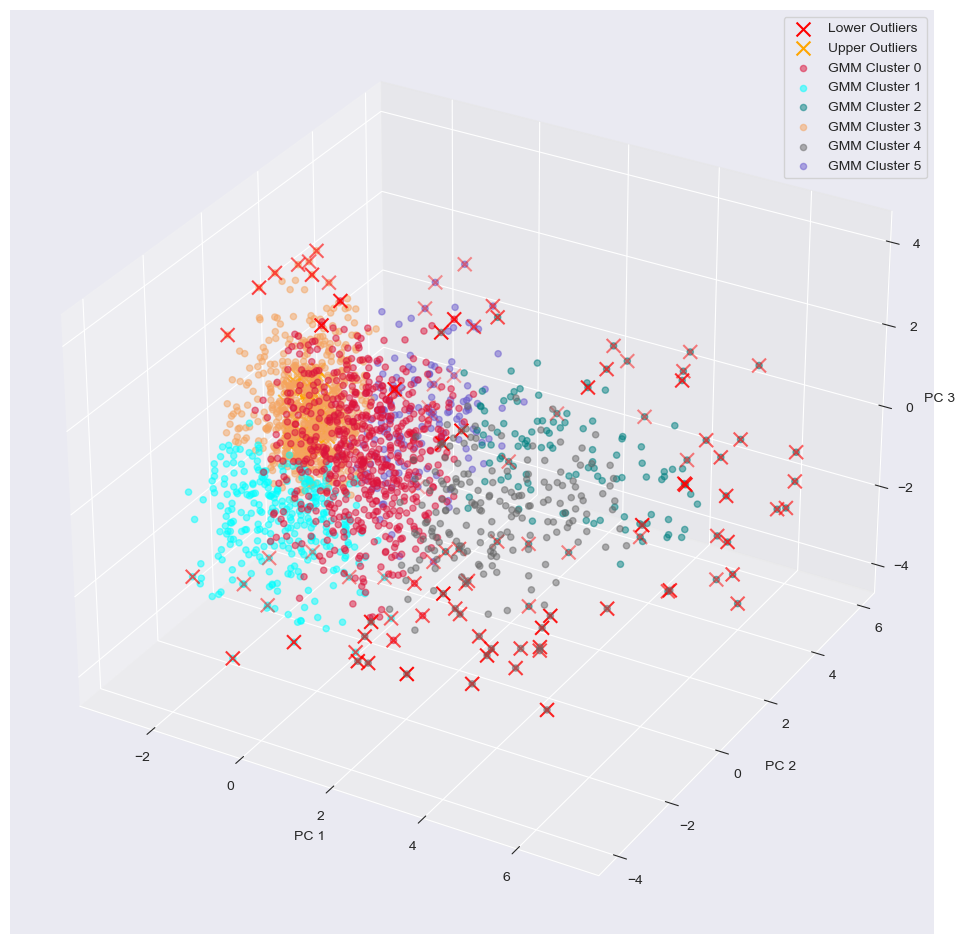

In [211]:
test_labels = plot_gmm(X_pca_test, n_clusters=best_n_components)

In [212]:
print(train_labels.shape)
print(X_train.shape)

(6480,)
(6480, 34)


In [213]:
# Add cluster labels to data frame
X_train["Cluster"] = train_labels
X_val["Cluster"] = val_labels
f_test["Cluster"] = test_labels

(array([1779.,  931.,  271., 1695.,    0.,  668.,  488.,    0.,  648.]),
 array([0.        , 0.77777778, 1.55555556, 2.33333333, 3.11111111,
        3.88888889, 4.66666667, 5.44444444, 6.22222222, 7.        ]),
 <BarContainer object of 9 artists>)

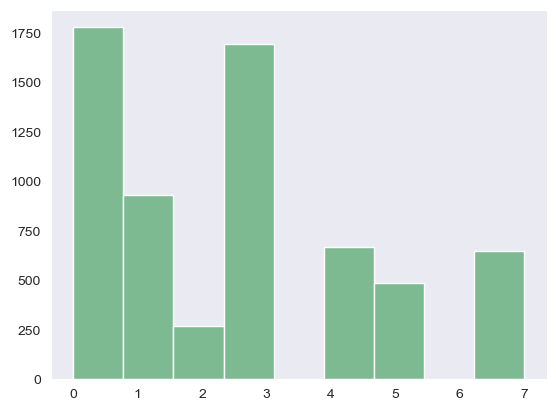

In [214]:
plt.hist(X_train["Cluster"], bins=9)

##### Feature Selection

<!-- # Dropping rows with cluster of outliers on the training dataset to eliminate noise
outlier_cluster = best_n_components + 1
# X_train_drop = pd.concat(X_train, y_train)
X_train_drop = X_train.copy()
X_train_drop["Attrition_Flag"] = y_train
X_train_drop = X_train_drop[X_train_drop.Cluster != outlier_cluster]
y_train = X_train_drop[target]
X_train = X_train_drop.drop(target, axis=1) -->

In [215]:
temp_df = X_train.copy()
temp_df["Attrition_Flag"] = y_train

In [216]:
temp_df.head()

,train_idx,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Cluster,Attrition_Flag
4511,4511,714139308,53,3,42,2,5,1,1438.3,0,...,0,0,1,0,0,1,0,0,0,1
3780,3780,820981383,44,4,39,5,1,4,9235.0,1796,...,0,0,0,0,1,1,0,0,3,1
5729,5729,711567333,43,1,31,5,3,2,2834.0,1720,...,0,0,1,0,0,1,0,0,0,1
6218,6218,713853858,41,4,31,5,2,2,34516.0,1433,...,0,0,0,1,0,0,0,0,4,1
5210,5210,708824958,50,4,42,2,1,2,1460.0,0,...,0,0,0,0,1,1,0,0,3,1


C:\Users\Vladi\AppData\Local\Temp\ipykernel_12976\668804696.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr_matrix, dtype=np.bool)


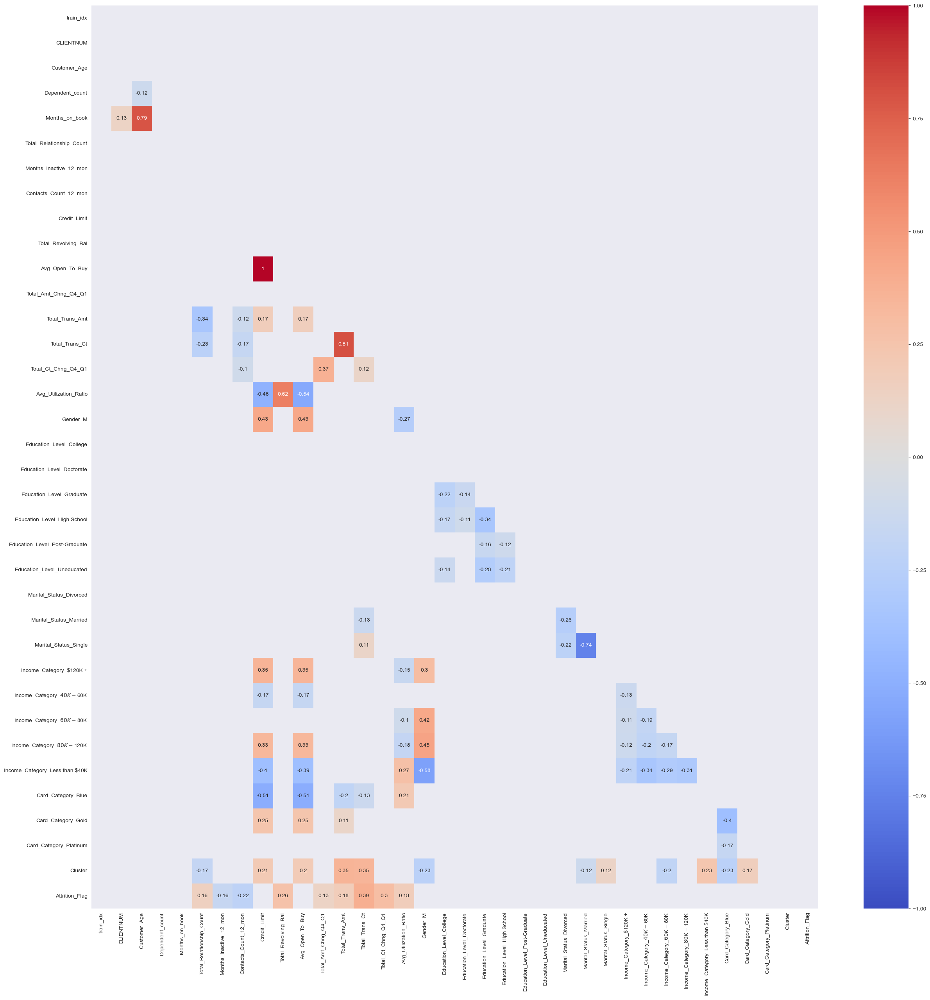

In [217]:
plot_corr_heatmap(temp_df)

In [218]:
def feature_selection(df = temp_df, target_variable = "Attrition_Flag", method="pearson", threshold=0.1):
    corr_matrix = df.corr(method=method)
    var = pd.DataFrame(corr_matrix.loc[:,target_variable])
    var = pd.DataFrame(var.iloc[:,0], columns=[target_variable]).reset_index()
    var[target_variable] = var[target_variable].abs()
    var = var[var[target_variable] != 1.000000]
    var = var.drop_duplicates(subset=["index"])
    selected_rows = var[var[target_variable] > threshold]
    features = [i for i in selected_rows.iloc[:,0]]
    return features

In [219]:
selected_features = feature_selection()
selected_features

['Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Total_Revolving_Bal',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

Let's check the VIF and multicollinearity

In [220]:
def multicollinearity_selection(df=X_train, selected_features=selected_features):
    # Compute the VIF for each feature
    vif = pd.DataFrame()
    vif["features"] = selected_features
    vif["VIF"] = [variance_inflation_factor(df[selected_features].values, i)\
                  for i in range(len(selected_features))]
    print(vif)
    no_vif = vif[vif["VIF"] < 10]["features"]
    no_vif = [i for i in no_vif]
    return no_vif

In [221]:
features = multicollinearity_selection()

                   features        VIF
0  Total_Relationship_Count   7.020139
1    Months_Inactive_12_mon   5.481339
2     Contacts_Count_12_mon   5.168899
3       Total_Revolving_Bal   5.013245
4      Total_Amt_Chng_Q4_Q1  13.572760
5           Total_Trans_Amt   8.439894
6            Total_Trans_Ct  21.003604
7       Total_Ct_Chng_Q4_Q1  11.254611
8     Avg_Utilization_Ratio   3.382965


##### The model

In [222]:
X_train = X_train[features]
X_val = X_val[features]
X_test = f_test[features]

In [223]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [224]:
X_test

array([[ 0.1259957 ,  0.63087548,  1.40478347,  0.42103175, -0.19197903,
         0.84680876],
       [ 0.76887138,  2.58782766,  1.40478347,  0.49601522, -0.11068478,
         1.6221852 ],
       [ 0.1259957 ,  0.63087548,  0.49502963, -0.21940081,  0.10050355,
         1.0845421 ],
       ...,
       [-1.80263135, -0.34760061,  0.49502963,  0.08545   ,  0.24571393,
        -0.18824564],
       [ 1.41174706, -0.34760061, -0.4147242 ,  0.23172923, -0.67503184,
        -0.42963641],
       [-1.80263135, -1.3260767 , -1.32447804, -0.0239521 ,  1.08074728,
        -0.80635232]])

In [225]:
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(6480, 6) (6480,)
(1621, 6) (1621,)


In [226]:
# Create a pipeline for Logistic Regression 
log_pipeline = make_pipeline(StandardScaler(),\
                     LogisticRegression(class_weight='auto', random_state=42))

In [227]:
# Create a pipeline for Random Forest classifier
rf_pipeline = make_pipeline(StandardScaler(),
    RandomForestClassifier(n_estimators=100, random_state=42)
)

In [228]:
# Create a pipeline for SVM classifier
svm_pipeline = make_pipeline(StandardScaler(),
    SVC(kernel='rbf', C=1.0, random_state=42)
)

In [229]:
log_pipeline.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression',
                 LogisticRegression(class_weight='auto', random_state=42))])

In [230]:
rf_pipeline.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=42))])

In [231]:
svm_pipeline.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(random_state=42))])

In [232]:
# Predict on the testing data
y_pred_log = log_pipeline.predict(X_val)
y_pred_rf = rf_pipeline.predict(X_val)
y_pred_svm = svm_pipeline.predict(X_val)

In [233]:
# Evaluate the model using the classification report
print("          Logistic Regression - Classsification Report")
print(classification_report(y_val, y_pred_log))
print("\n\n\n              Random Forest - Classsification Report")
print(classification_report(y_val, y_pred_rf))
print("\n\n\n         Support Vector Machines - Classsification Report")
print(classification_report(y_val, y_pred_svm))

          Logistic Regression - Classsification Report
              precision    recall  f1-score   support

           0       0.74      0.31      0.44       235
           1       0.89      0.98      0.94      1386

    accuracy                           0.88      1621
   macro avg       0.82      0.65      0.69      1621
weighted avg       0.87      0.88      0.86      1621




              Random Forest - Classsification Report
              precision    recall  f1-score   support

           0       0.77      0.67      0.72       235
           1       0.95      0.97      0.96      1386

    accuracy                           0.92      1621
   macro avg       0.86      0.82      0.84      1621
weighted avg       0.92      0.92      0.92      1621




         Support Vector Machines - Classsification Report
              precision    recall  f1-score   support

           0       0.86      0.43      0.57       235
           1       0.91      0.99      0.95      1386

    accura

##### Stacking

In [234]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
svm = SVC(kernel='rbf', C=1.0, random_state=42)
logreg = LogisticRegression(random_state=42)

In [235]:
estimators = [('rf', rf), ('svm', svm)]
stacking_clf = StackingClassifier(
    estimators=estimators,
    final_estimator=logreg,
    cv=5,
    stack_method='predict'
)

In [236]:
# Create a pipeline for the stacking classifier
stacking_pipeline = make_pipeline(
    StandardScaler(),
    stacking_clf
)

In [237]:
%%time
# Evaluate the stacking classifier using cross-validation
stacking_scores = cross_val_score(stacking_pipeline, X_train, y_train,\
                                  cv=5, scoring='accuracy', error_score='raise')

CPU times: total: 26.8 s
Wall time: 28.1 s


In [238]:
# Print the mean accuracy score of the stacking classifier
print(f'Stacking mean accuracy: {stacking_scores.mean():.3f}')

Stacking mean accuracy: 0.920


In [239]:
# Fit the stacking classifier on the training data
stacking_pipeline.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('stackingclassifier',
                 StackingClassifier(cv=5,
                                    estimators=[('rf',
                                                 RandomForestClassifier(random_state=42)),
                                                ('svm', SVC(random_state=42))],
                                    final_estimator=LogisticRegression(random_state=42),
                                    stack_method='predict'))])

In [240]:
def plot_roc_curves(models, X_test, y_test):
    """
    Plots a receiver operating characteristic (ROC) curve and computes the area
    under the curve (AUC) for multiple binary classification models on a single
    graph.
    
    Parameters:
        models (list of tuples): Each tuple contains the name of the model as
            the first element and the predicted scores (either probabilities or
            decision function values) as the second element.
        X_test (array-like): Test features.
        y_test (array-like): True binary labels.
    
    Returns:
        None.
    """
    plt.figure(figsize=(8, 6))
    
    colors = ['red', 'green', 'blue', 'orange', 'orange']  # Specify a list of colors for each curve
    
    for i, (name, y_score) in enumerate(models):
        fpr, tpr, _ = roc_curve(y_test, y_score)
        roc_auc = roc_auc_score(y_test, y_score)

        # Plot the ROC curve with a different color for each model
        plt.plot(fpr, tpr, color=colors[i], label=f'{name} (AUC = {roc_auc:.2f})')
        
    plt.plot([0, 1], [0, 1], linestyle='--', label='Random guessing', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

In [241]:
models = [
    ('Random Forest', log_pipeline.predict(X_val)),
    ('SVM', rf_pipeline.predict(X_val)),
    ('Logistic Regression', svm_pipeline.predict(X_val)),
    ('Stacking', stacking_pipeline.predict(X_val))
]

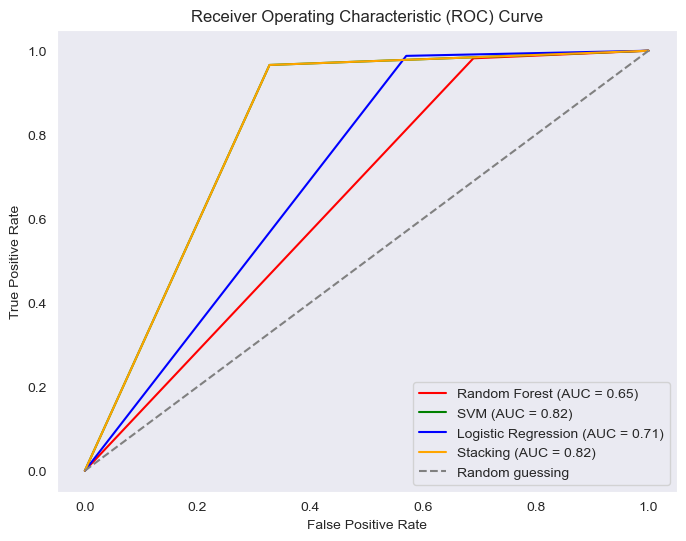

In [242]:
plot_roc_curves(models, X_val, y_val)

In [243]:
# Use the trained stacking classifier to predict the labels for the test data
y_pred = stacking_pipeline.predict(X_test)

<AxesSubplot:ylabel='count'>

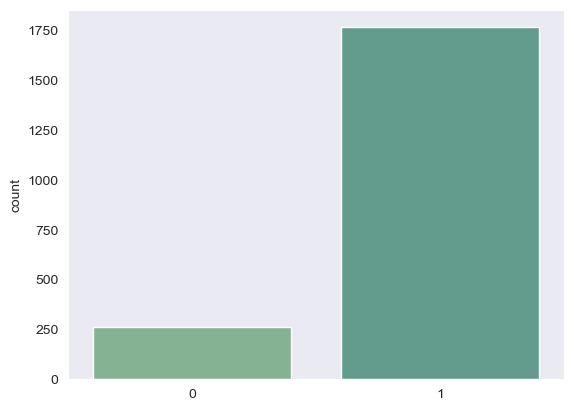

In [244]:
sns.countplot(x=y_pred)

Saving the results 

In [245]:
# Add the idx_test column from the test dataframe to the results dataframe
results = pd.DataFrame({'target': y_pred})
# Save the predictions to CSV and JSON files
results.to_csv('predictions.csv')
results.to_json('predictions.json')